## Analizar comportamiento de outliers

Dependencias: pandas json plotly 

Opera con:
* alpha-out.tsv generado por alpha-vis-single
* feature-table.tsv generado por extract-features.sh

### Parte 1: Carga de muestras - identificacion de outliers

In [52]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import json,glob
pd.options.mode.chained_assignment = None  # default='warn'

for file in glob.glob('./alpha-out*.tsv'):
    complete = pd.read_csv(file, sep='\t')
display(complete.head())

with open('category.txt', 'r') as f:
    category = f.readline().rstrip()
display(complete[category])


metrics = ['ace', 'berger_parker_d', 'brillouin_d', 'chao1', 'dominance', 'doubles', 'enspie', 'faith_pd', 'fisher_alpha', 'sample-frequency', 'gini_index', 'goods_coverage', 'heip_e', 'lladser_pe', 'margalef', 'mcintosh_d', 'menhinick', 'observed_features', 'pielou_evenness', 'robbins', 'shannon_entropy', 'simpson', 'singles', 'strong', 'sample-frequency']

,folder,dataset,sample-id,ace,berger_parker_d,brillouin_d,chao1,dominance,doubles,enspie,...,acne_medication,dog,multivitamin,other_supplement_frequency,Cat,alcohol_consumption,acne_medication_otc,seasonal_allergies,lactose,subset_age
0,888_AGP,888_AGP_Normal,sample-2311,170.442363,0.102778,3.798371,165.240000,0.035722,24,27.994263,...,No,No,No,No,No,Yes,No,No,No,True
1,888_AGP,888_AGP_Normal,sample-42,237.725891,0.122222,3.845377,237.555556,0.046973,26,21.288743,...,false,false,false,false,false,true,false,false,false,True
2,888_AGP,888_AGP_Overweight,sample-1310,148.030254,0.173333,2.935182,136.565217,0.084608,22,11.819191,...,false,false,false,false,false,true,false,Yes,false,True
3,888_AGP,888_AGP_Overweight,sample-2303,215.481518,0.219074,3.727398,211.840000,0.066333,24,15.075502,...,No,Yes,No,No,No,Yes,No,No,No,True
4,888_AGP,888_AGP_Normal,sample-1809,173.347694,0.382593,2.823902,161.791667,0.165072,23,6.057975,...,false,true,false,true,true,true,true,false,false,True


0           Normal
1           Normal
2       Overweight
3       Overweight
4           Normal
           ...    
2434        Normal
2435        Normal
2436    Overweight
2437        Normal
2438    Overweight
Name: bmi_cat, Length: 2439, dtype: object

### Funcion para identificar outliers

Utiliza el criterio de IQR. 

Aplicar sobre cada subgrupo (control - intervencion)

In [53]:
import json
#Solo defino funcion, esto se aplica para cada grupo
#Encuentra outliers segun criterio de IQR
def get_outliers(df,opt):
    outlier_tt = df['sample-id']
    outliers_dict = {}
    for x in metrics:
        temp = df[x]
        Q1 = temp.quantile(0.25)
        Q3 = temp.quantile(0.75)
        IQR = Q3 - Q1
        R1 = Q1 - 1.5*IQR
        R2 = Q3 + 1.5*IQR
        tt = (temp < R1) | (temp > R2) #truth table
        tt_samp=df[tt]['sample-id'] #samples
        #Acumulo
        outliers_dict[x]=tt_samp.to_list()
        outlier_tt = pd.concat([outlier_tt,tt], axis=1)
    
    #Guardo a archivos
    name1 = "outliers_tt." + str(opt) + '.tsv'
    name2 = "outliers." + str(opt) + '.json'
    outlier_tt.to_csv(name1, sep='\t',index=False)
    json.dump(outliers_dict, open(name2,'w'))
    return [outliers_dict, outlier_tt]

In [54]:
#Busca categorias
options = complete[category].unique()
print(complete[category].value_counts())
print(options)
dfs= {}
outliers = {}
ttables = {}

for opt in options:
    dfs[opt] = complete[complete[category]==opt]
    outliers[opt], ttables[opt] = get_outliers(dfs[opt],opt)

Normal        1724
Overweight     715
Name: bmi_cat, dtype: int64
['Normal' 'Overweight']


## Seleccion de muestras - particion en grupos

Cambiar primera linea para elegir subgrupo

In [55]:
#seleciono sobre que subgrupo voy a trabajar
gr0 = str(options[1])
print(gr0)

Overweight


In [56]:
#Selecciono sobre que grupo voy a trabajar
tt = ttables[gr0] #truthtable
df = dfs[gr0] #dataframe
dic = outliers[gr0] #diccionario con outliers para construir dataframe
dataset = df['dataset'].unique()[0]

#Construyo lista de samples outliers a partir de diccionario - no mirar mucho
outlist = list(dic.values())
outlist = [item for sublist in outlist for item in sublist]
outlist = list(set(outlist))

#Construyo df
df['is_outlier'] = 'False'
df['is_outlier_n'] = 0
for m in metrics:
    df.loc[tt[m],'is_outlier'] = m
    df.loc[tt[m],'is_outlier_n'] += 1

#print(df['is_outlier'].value_counts())
#display(tt.head())

KeyError: "None of [Index([('s', 'a', 'm', 'p', 'l', 'e', '-', 'f', 'r', 'e', 'q', 'u', 'e', 'n', 'c', 'y'), ('s', 'a', 'm', 'p', 'l', 'e', '-', 'f', 'r', 'e', 'q', 'u', 'e', 'n', 'c', 'y')], dtype='object')] are in the [index]"

## Operaciones sobre matriz para para visualizar

In [57]:
# Uso truth table para formar tabla con metricas.
cols = ['sample-id'] + metrics
new = pd.melt(tt, id_vars = 'sample-id')
new.rename(columns={'variable':'Metric','value':'outlier'}, inplace=True)
new.loc[new.outlier==False,'Metric']='Not an outlier'
new.drop_duplicates(inplace=True)
new = new.merge(df[cols],left_on = 'sample-id', right_on ='sample-id')

# Ajuste para quitar duplicados
are_out = new.drop(new[new.Metric=='Not an outlier'].index)
to_remove = new[ new['sample-id'].isin(are_out['sample-id'].unique())]
to_remove = to_remove.drop(to_remove[to_remove.Metric != 'Not an outlier'].index)
new = new.drop(to_remove.index)
display(new)

,sample-id,Metric,outlier,ace,berger_parker_d,brillouin_d,chao1,dominance,doubles,enspie,...,mcintosh_d,menhinick,observed_features,pielou_evenness,robbins,shannon_entropy,simpson,singles,strong,sample-frequency
0,sample-1310,Not an outlier,False,148.030254,0.173333,2.935182,136.565217,0.084608,22,11.819191,...,0.718908,1.564952,115,0.626528,0.005926,4.288889,0.915392,32,0.732923,17151.0
1,sample-2303,Not an outlier,False,215.481518,0.219074,3.727398,211.840000,0.066333,24,15.075502,...,0.752691,2.612789,192,0.721874,0.005926,5.475388,0.933667,32,0.607292,12214.0
2,sample-1858,Not an outlier,False,274.322341,0.270370,3.454769,262.279070,0.096920,42,10.317800,...,0.698181,3.116295,229,0.649275,0.010000,5.089800,0.903080,54,0.673798,41033.0
4,sample-136,dominance,True,121.111013,0.728704,1.476692,133.800000,0.535517,9,1.867353,...,0.271910,1.306395,96,0.330152,0.005185,2.174040,0.464483,28,0.795509,21680.0
5,sample-136,simpson,True,121.111013,0.728704,1.476692,133.800000,0.535517,9,1.867353,...,0.271910,1.306395,96,0.330152,0.005185,2.174040,0.464483,28,0.795509,21680.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1066,sample-1680,Not an outlier,False,257.188643,0.234444,3.698644,262.357143,0.070210,27,14.242899,...,0.745168,2.925779,215,0.701883,0.009630,5.438328,0.929790,52,0.655784,16825.0
1067,sample-886,Not an outlier,False,179.430740,0.130185,3.595390,171.483871,0.051801,30,19.304508,...,0.783057,2.190932,161,0.718655,0.004815,5.268402,0.948199,26,0.643565,10803.0
1068,sample-2404,Not an outlier,False,174.161131,0.647593,1.955820,185.000000,0.424159,14,2.357609,...,0.353536,1.809901,133,0.408534,0.007407,2.882324,0.575841,40,0.748144,35445.0
1069,sample-912,Not an outlier,False,132.982602,0.540926,2.220102,129.000000,0.306657,23,3.260970,...,0.452390,1.687426,124,0.469106,0.002963,3.262253,0.693343,16,0.762873,8355.0


## Visualizaciones

### Seccion 1:  Samples vs Observed Features

In [58]:
fig = go.Figure()
for m in new.Metric.unique():
    dat = new[new.Metric == m]
    fig.add_trace(go.Box(y=dat['observed_features'],
                        name=m,
                        boxpoints='all', 
                        jitter=0.3,
                        pointpos=-1.8))

    fig.update_layout(title="Observed Features for all samples, grouped if they are outliers for a metric",
                   xaxis_title='Outlier category',
                   yaxis_title='Observed Features (n)', height=600)
fig.show()

In [59]:
fig = go.Figure()
for m in new.Metric.unique():
    dat = new[new.Metric == m]
    fig.add_trace(go.Box(y=dat['faith_pd'],
                        name=m,
                        boxpoints='all', 
                        jitter=0.3,
                        pointpos=-1.8))

    fig.update_layout(title="Faith PD index for all samples, grouped if they are outliers for a metric",
                   xaxis_title='Outlier category',
                   yaxis_title='Faith PD',
                   height = 600)
fig.show()

In [60]:
px.scatter(new, x='observed_features', y='faith_pd', color='Metric', title='Faith PD index for all samples, correlated with observed features')

# Trabajo sobre Feature Table

In [61]:
freq = pd.read_csv('feature-table.tsv', sep='\t', header=1)
freq.rename(columns={'#OTU ID':'OTU'}, inplace = True)
display(freq.tail())

,OTU,sample-2311,sample-42,sample-1310,sample-2303,sample-1809,sample-529,sample-1688,sample-534,sample-284,...,sample-1646,sample-886,sample-1147,sample-2155,sample-2404,sample-647,sample-1212,sample-912,sample-39,sample-2373
9414,5c82dffd5a51975fdc64ddc69b7eafeb,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9415,724c2d70bca64f25dfa9605c0e42cf9b,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0
9416,1aa8d6b8f450e766ecd8fee927882036,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,57.0,0.0,0.0,0.0
9417,a2b0ecc161568070d8ce31e9378563e4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0
9418,9cb2621203b2865b29a31eaef2893d05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0


### Seleccion de muestras para visualizar

In [62]:
print("OUTLIERS PRESENT IN DATASET\n\n")
samples_dict = {}
outliers_present= new.Metric.unique()
for f in outliers_present:
    samples_dict[f] = list(new[new.Metric==f]['sample-id'])
    print(f"{len(samples_dict[f])} \t {f}")

OUTLIERS PRESENT IN DATASET


568 	 Not an outlier
67 	 dominance
67 	 simpson
43 	 sample-frequency
21 	 lladser_pe
18 	 berger_parker_d
22 	 mcintosh_d
20 	 pielou_evenness
11 	 brillouin_d
11 	 shannon_entropy
12 	 strong
14 	 doubles
4 	 goods_coverage
4 	 robbins
4 	 singles
16 	 enspie
4 	 fisher_alpha
7 	 gini_index
4 	 faith_pd
2 	 ace
2 	 chao1
1 	 margalef
1 	 menhinick
1 	 observed_features


## Genero visualizacion de Feature Table

In [63]:
to_compare =  ['Not an outlier', 'chao1','strong','fisher_alpha','margalef', 'simpson'] 
#to_compare =  ['Not an outlier', 'chao1' ,'fisher_alpha','margalef',  'ace', 'menhinick'] 
to_compare =  ['Not an outlier', 'berger_parker_d' , 'strong','mcintosh_d','gini_index', 'enspie', 'simpson'] 
#to_compare =  ['Not an outlier', 'shannon_entropy' , 'simpson','pielou_evenness', 'faith_pd'] 

#to_compare =  ['Not an outlier', 'lladser_pe','robbins','goods_coverage'] 
#to_compare = outliers_present
#to_compare = ['Not an outlier', 'berger_parker_d', 'mcintosh_d', 'pielou_evenness', 'brillouin_d', 'shannon_entropy']

to_downsample = ['Not an outlier']

In [64]:
import random
sd = samples_dict
#Downsample de grupos muy grandes (Ejemplo Not an Outlier)
for f in to_downsample:
    sd[f] = random.sample(sd[f], 50)    

#Particion de muestras
selected = []
for f in to_compare:
    selected.append(sd[f])
selected = [val for sublist in selected for val in sublist]
print(f"Cantidad de muestras a graficar: {len(selected)}")

Cantidad de muestras a graficar: 192


In [65]:
selected_samples = freq[set(selected)]

## Desvinculo columnas, ordeno por abundancia y dropeo filas con todos ceros
#display(selected_samples.columns)
#selected_samples = pd.DataFrame(pd.np.sort(selected_samples.values, axis=0)[::-1], index=selected_samples.index, columns=selected_samples.columns)

for col in selected_samples:
    selected_samples[col] = selected_samples[col].sort_values(ascending = False, ignore_index=True)
selected_samples = selected_samples.loc[~(selected_samples==0).all(axis=1)]


fig = go.Figure()
for idx_metric,metric in enumerate(to_compare):
    for idx, sample in enumerate(sd[metric]):
        show_legend = True if idx == 0 else False
        fig.add_trace(go.Scatter(y = selected_samples[sample],
                    line=dict(color=px.colors.qualitative.Plotly[idx_metric%10]),
                    name=metric,
                    legendgroup=metric,
                    showlegend=show_legend))
        
fig.update_layout(title='Abundancia de cada OTU para muestras ouliers',
                   xaxis_title='OTUs en orden de abundancia',
                   yaxis_title='Abundancia (log)')

fig.update_yaxes(type="log")
fig.show()

In [66]:
## CODIGO PARA TOMAR COLORES SEGUN METRICAS

def get_color(colorscale_name, loc):
    from _plotly_utils.basevalidators import ColorscaleValidator
    # first parameter: Name of the property being validated
    # second parameter: a string, doesn't really matter in our use case
    cv = ColorscaleValidator("colorscale", "")
    # colorscale will be a list of lists: [[loc1, "rgb1"], [loc2, "rgb2"], ...] 
    colorscale = cv.validate_coerce(colorscale_name)
    
    if hasattr(loc, "__iter__"):
        return [get_continuous_color(colorscale, x) for x in loc]
    return get_continuous_color(colorscale, loc)


import plotly.colors
from PIL import ImageColor

def get_continuous_color(colorscale, intermed):
    """
    Plotly continuous colorscales assign colors to the range [0, 1]. This function computes the intermediate
    color for any value in that range.

    Plotly doesn't make the colorscales directly accessible in a common format.
    Some are ready to use:
    
        colorscale = plotly.colors.PLOTLY_SCALES["Greens"]

    Others are just swatches that need to be constructed into a colorscale:

        viridis_colors, scale = plotly.colors.convert_colors_to_same_type(plotly.colors.sequential.Viridis)
        colorscale = plotly.colors.make_colorscale(viridis_colors, scale=scale)

    :param colorscale: A plotly continuous colorscale defined with RGB string colors.
    :param intermed: value in the range [0, 1]
    :return: color in rgb string format
    :rtype: str
    """
    if len(colorscale) < 1:
        raise ValueError("colorscale must have at least one color")

    hex_to_rgb = lambda c: "rgb" + str(ImageColor.getcolor(c, "RGB"))

    if intermed <= 0 or len(colorscale) == 1:
        c = colorscale[0][1]
        return c if c[0] != "#" else hex_to_rgb(c)
    if intermed >= 1:
        c = colorscale[-1][1]
        return c if c[0] != "#" else hex_to_rgb(c)

    for cutoff, color in colorscale:
        if intermed > cutoff:
            low_cutoff, low_color = cutoff, color
        else:
            high_cutoff, high_color = cutoff, color
            break

    if (low_color[0] == "#") or (high_color[0] == "#"):
        # some color scale names (such as cividis) returns:
        # [[loc1, "hex1"], [loc2, "hex2"], ...]
        low_color = hex_to_rgb(low_color)
        high_color = hex_to_rgb(high_color)

    return plotly.colors.find_intermediate_color(
        lowcolor=low_color,
        highcolor=high_color,
        intermed=((intermed - low_cutoff) / (high_cutoff - low_cutoff)),
        colortype="rgb",
    )


## BOILERPLATE SELECCIONA METRICAS PARA TRABJAR AL AZAR

for col in selected_samples:
    selected_samples[col] = selected_samples[col].sort_values(ascending = False, ignore_index=True)
selected_samples = selected_samples.loc[~(selected_samples==0).all(axis=1)]


## Selecciono con que metrica coloreo las lineas
color_by = 'simpson'
#for color_by_metric in metrics: 
#color_by = color_by_metric
fig = go.Figure()
for idx_metric,metric in enumerate(to_compare):
    for idx, sample in enumerate(sd[metric]):
        show_legend = True if idx == 0 else False
        color_val = new.loc[new['sample-id'] == sample][color_by].values[0]
        color_val_normalized = (color_val - min(new[color_by])) / (max(new[color_by]) - min(new[color_by]))
        fig.add_trace(go.Scatter(y = selected_samples[sample],
                    line=dict(color=get_color('Plasma', color_val_normalized)),
                    name=metric,
                    legendgroup=metric,
                    showlegend=True))
        
colorbar_trace  = go.Scatter(x=[None],
                            y=[None],
                            mode='markers',
                            marker=dict(
                                colorscale='Plasma', 
                                showscale=True,
                                cmin=-5,
                                cmax=5,
                                colorbar=dict(thickness=5, tickvals=[-5, 5], ticktext=['Low', 'High'], outlinewidth=0)
                            ),
                            hoverinfo='none'
                            )

fig['layout']['showlegend'] = True
fig.add_trace(colorbar_trace)

fig.update_layout(
                title = f'Abundancias de los ASVs en cada muestra, coloreado segun valor de metrica {color_by}',
                xaxis_title='ASVs en orden de abundancia',
                yaxis_title='Abundancia de cada ASV(log)',
                height= 500, width = 1000)

fig.update_yaxes(type="log")
fig.show()
    #fig.write_image(f'ABUNDANCIAS_{color_by}.png', scale = 2)

ModuleNotFoundError: No module named 'PIL'

In [67]:
metrics
diversities.columns

Index(['sample', 'ace', 'berger_parker_d', 'brillouin_d', 'chao1', 'dominance',
       'enspie', 'fisher_alpha', 'gini_index', 'heip_e', 'margalef',
       'mcintosh_d', 'menhinick', 'observed_features', 'pielou_evenness',
       'robbins', 'shannon_entropy', 'simpson', 'strong', 'OTU1', 'OTU2',
       'OTU_RATIO'],
      dtype='object')

## Metricas Auxiliares

Se obtienen metricas auxiliares basadas en las formulas para analizar el comportamiento de las metricas

In [68]:
# Aislo metricas
diversities = complete [['sample-id']+metrics]
diversities.rename(columns={'sample-id':'sample'}, inplace=True)
#display(diversities.head())

# Obtengo abundancia de las 2 otus mas abundantes
abund = freq.copy()
for col in abund:
    abund[col] = abund[col].sort_values(ascending = False, ignore_index=True)
    abund[col] = abund[col].iloc[:2]
abund.dropna(inplace=True)
abund.OTU = ['OTU1','OTU2']
diversities['OTU1'] = 0
diversities['OTU2'] = 0
for col in abund:
    filt = (diversities['sample'] == col )
    diversities.loc[filt, 'OTU1'] = abund[col].iloc[0]
    diversities.loc[filt, 'OTU2'] = abund[col].iloc[1]

In [75]:
import numpy as np
# calculo ratios
diversities['OTU_RATIO'] = diversities['OTU1']/diversities['OTU2']
diversities['OTU1_RATIO'] = diversities['OTU1']/diversities['sample-frequency']
diversities['MEAN_FREQ'] = 0

# Obtengo media de frequcencias
abund = freq.drop(columns=['OTU'])
for col in abund:
    filt = (diversities['sample'] == col )
    diversities.loc[filt, 'MEAN_FREQ'] = abund[col].mean()

# Obtengo distancia euclidiana (mcintosh)
abund = freq.drop(columns=['OTU'])
diversities['MCINN_UDIST'] = 0
for col in abund:
    filt = (diversities['sample'] == col )
    dist = np.sqrt(np.sum((abund[col])**2))
    diversities.loc[filt, 'MCINN_UDIST'] = dist

TypeError: '<' not supported between instances of 'str' and 'int'

In [ ]:
# Obtengo numero de OTUS con abundancia menor a 10 (ace)
abund = freq.drop(columns=['OTU'])
diversities['ACE_SRARE'] = 0
for col in abund:
    filt = (diversities['sample'] == col )
    tmp = abund[col]
    tmp = tmp[tmp!=0]
    dist = len(tmp[tmp<10])
    diversities.loc[filt, 'ACE_SRARE'] = dist

In [44]:
diversities['LOGN'] = np.log(diversities['sample-frequency'])
diversities['LOGN_RATIO'] = diversities['LOGN']/diversities['sample-frequency']
diversities['SQRTN'] = np.sqrt(diversities['sample-frequency'])
diversities['OTU1_MEAN_RATIO'] = diversities['OTU1']/diversities['MEAN_FREQ']
diversities['LOG_SHANNON'] = np.log(diversities['shannon_entropy'])

KeyError: 'sample-frequency'

In [ ]:
aux_metrics = ['OTU1','OTU2','OTU_RATIO','OTU1_RATIO','OTU1_MEAN_RATIO','MEAN_FREQ','MCINN_UDIST','ACE_SRARE','LOGN','LOGN_RATIO','SQRTN']
for f in diversities:
    diversities[f] = pd.to_numeric(diversities[f], errors = 'ignore')

## Visualizaciones de a pares

In [33]:
display(new.head())

figbox = px.scatter(diversities, x='faith_pd', y=new.columns,
             facet_col ="variable",
            facet_col_wrap=4,
            facet_row_spacing=0.04,
            title="Correlaciones entre Faith PD y otras metricas",
            height=2000,facet_col_spacing=0.04)
figbox.update_yaxes(matches=None)
figbox.update_traces(marker=dict(size=5))
figbox.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
figbox.update_yaxes(showticklabels=True,)
figbox.update_xaxes(showticklabels=True)
figbox.show(config=config)

#for col in new.columns:
#    fig = px.scatter(new, x='faith_pd', y=col, color='Metric', hover_data=['sample-id'])
#    fig.show()


,sample-id,Metric,outlier,ace,berger_parker_d,brillouin_d,chao1,dominance,doubles,enspie,...,margalef,mcintosh_d,menhinick,observed_features,pielou_evenness,robbins,shannon_entropy,simpson,singles,strong
0,sample-1310,Not an outlier,False,148.030254,0.173333,2.935182,136.565217,0.084608,22,11.819191,...,13.264831,0.718908,1.564952,115,0.626528,0.005926,4.288889,0.915392,32,0.732923
1,sample-2303,Not an outlier,False,215.481518,0.219074,3.727398,211.840000,0.066333,24,15.075502,...,22.224409,0.752691,2.612789,192,0.721874,0.005926,5.475388,0.933667,32,0.607292
2,sample-1858,Not an outlier,False,274.322341,0.270370,3.454769,262.279070,0.096920,42,10.317800,...,26.529661,0.698181,3.116295,229,0.649275,0.010000,5.089800,0.903080,54,0.673798
4,sample-136,dominance,True,121.111013,0.728704,1.476692,133.800000,0.535517,9,1.867353,...,11.054025,0.271910,1.306395,96,0.330152,0.005185,2.174040,0.464483,28,0.795509
5,sample-136,simpson,True,121.111013,0.728704,1.476692,133.800000,0.535517,9,1.867353,...,11.054025,0.271910,1.306395,96,0.330152,0.005185,2.174040,0.464483,28,0.795509


NameError: name 'diversities' is not defined

In [34]:
config = {
  'toImageButtonOptions': { 'height': None, 'width': None, }
}

metrics = ['ace', 'berger_parker_d', 'brillouin_d', 'chao1', 'dominance', 'enspie', 'fisher_alpha', 'gini_index', 'heip_e', 'margalef',
 'mcintosh_d', 'menhinick', 'observed_features', 'pielou_evenness', 'robbins', 'shannon_entropy', 'simpson', 'strong']
figbox = px.scatter(diversities, x='OTU1_RATIO', y=metrics,
             facet_col ="variable",
            facet_col_wrap=4,
            facet_row_spacing=0.04,
            title="Correlacion entre OTU1_RATIO (OTU1/suma freq) (log) y metricas",
            height=1400,facet_col_spacing=0.04)
figbox.update_yaxes(matches=None)
figbox.update_traces(marker=dict(size=5))
figbox.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
figbox.update_yaxes(showticklabels=True)
figbox.update_xaxes(showticklabels=True, type = 'log')
figbox.show(config = config)

NameError: name 'diversities' is not defined

In [48]:
fig = px.scatter(diversities, x='observed_features', y='faith_pd', width=600, title = 'Relacion OTU_RATIO vs OTU1_RATIO')
fig.update_xaxes(type = 'log')
fig.update(layout_title_text="Relacion OTU_RATIO (log) vs OTU1_RATIO")

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['sample', 'ace', 'berger_parker_d', 'brillouin_d', 'chao1', 'dominance', 'enspie', 'fisher_alpha', 'gini_index', 'heip_e', 'margalef', 'mcintosh_d', 'menhinick', 'observed_features', 'pielou_evenness', 'robbins', 'shannon_entropy', 'simpson', 'strong', 'OTU1', 'OTU2', 'OTU_RATIO'] but received: faith_pd

In [46]:
fig = px.scatter(diversities, x = 'berger_parker_d', y='simpson', color = 'OTU_RATIO', size = 'OTU_RATIO', width = 600)
fig.show()
fig.write_image('otu_ratio_berger_simpson.png', scale = 2)

TypeError: '<=' not supported between instances of 'int' and 'list'

In [38]:
fig = px.scatter(diversities, x = 'strong', y='simpson', color = 'OTU_RATIO', size = 'OTU_RATIO',width = 600)
fig.show()
fig.write_image('otu_ratio_strong_simpson.png', scale = 2)

NameError: name 'diversities' is not defined

In [17]:
fig = px.scatter(diversities, x = 'gini_index', y='berger_parker_d', color = 'OTU_RATIO',width = 600)
fig.show()
fig.write_image('otu_ratio_gini_berger.png', scale = 2)

NameError: name 'diversities' is not defined

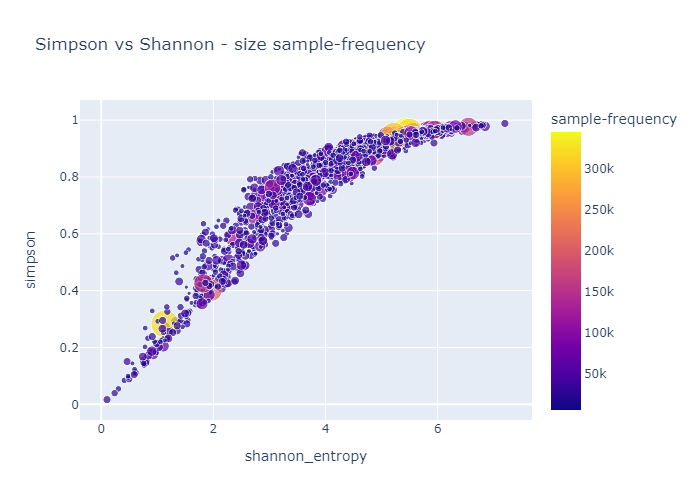

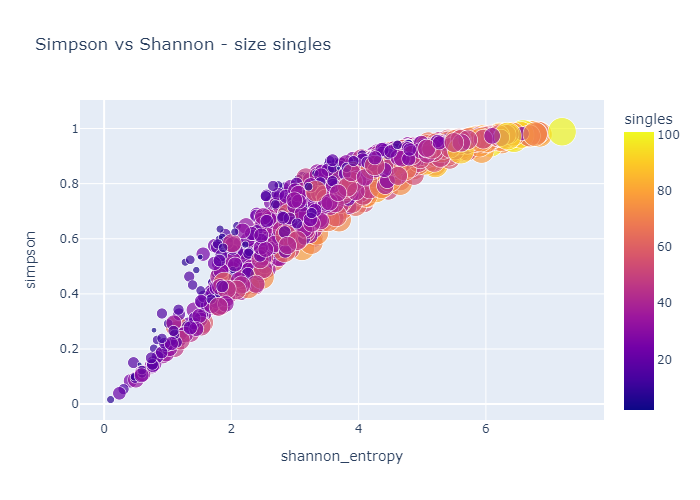

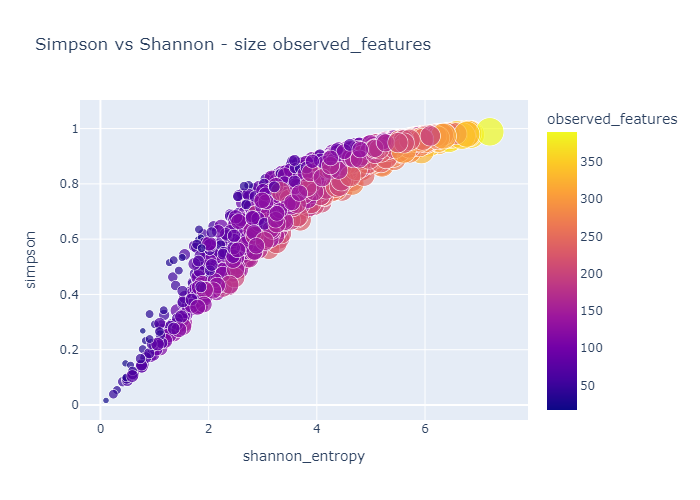

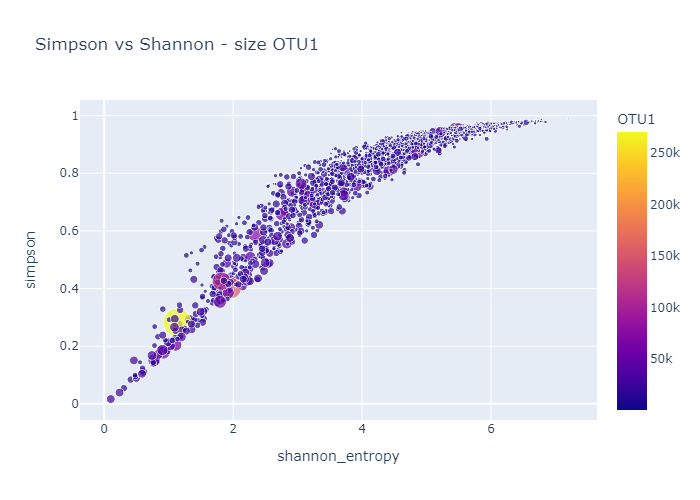

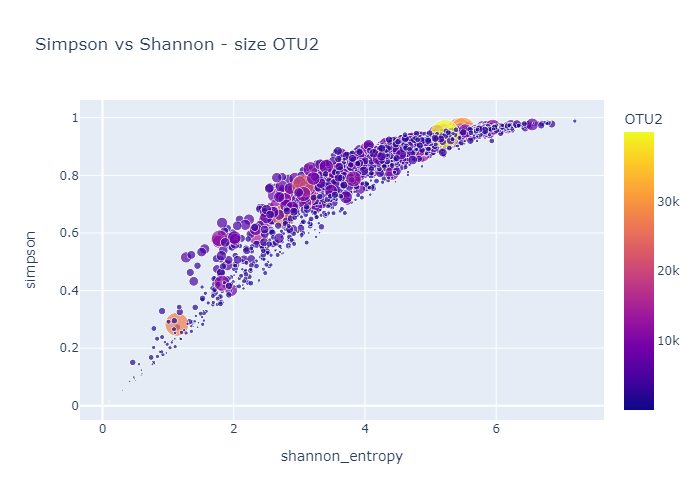

...

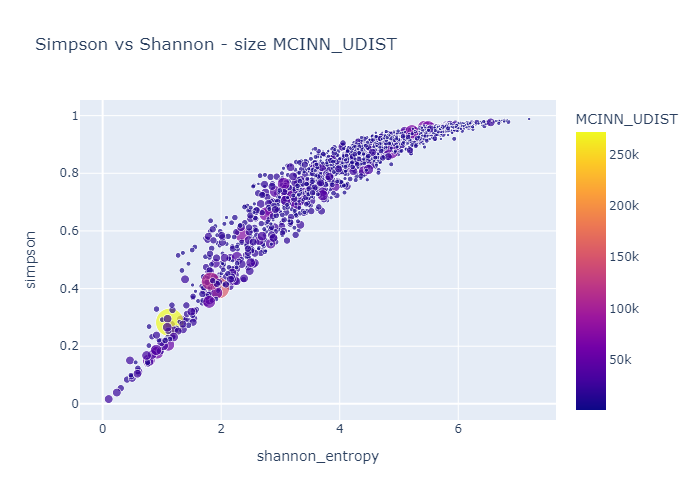

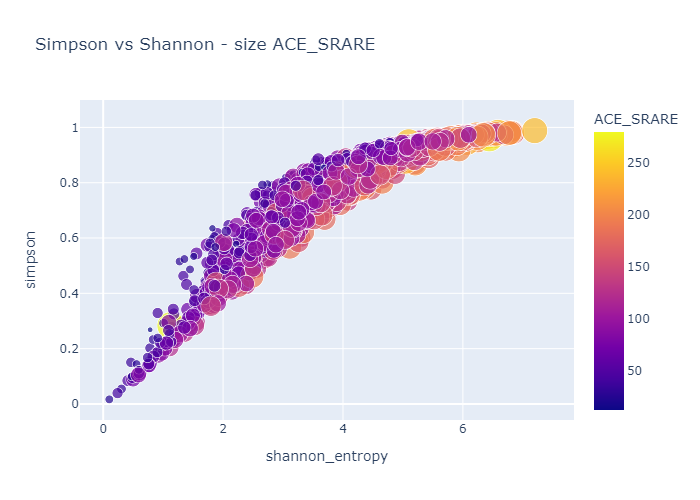

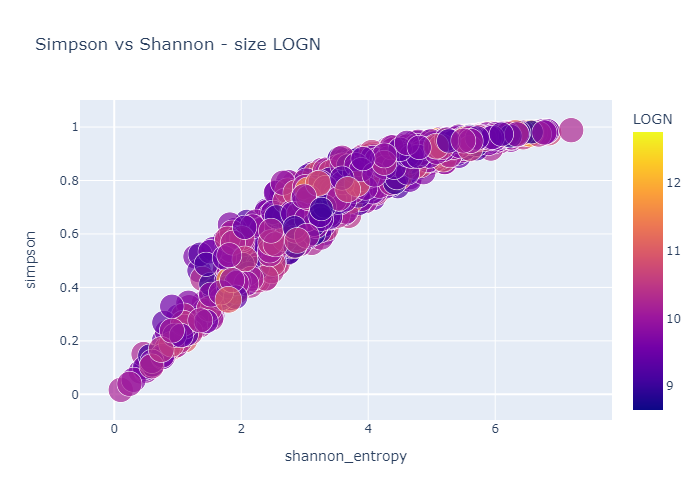

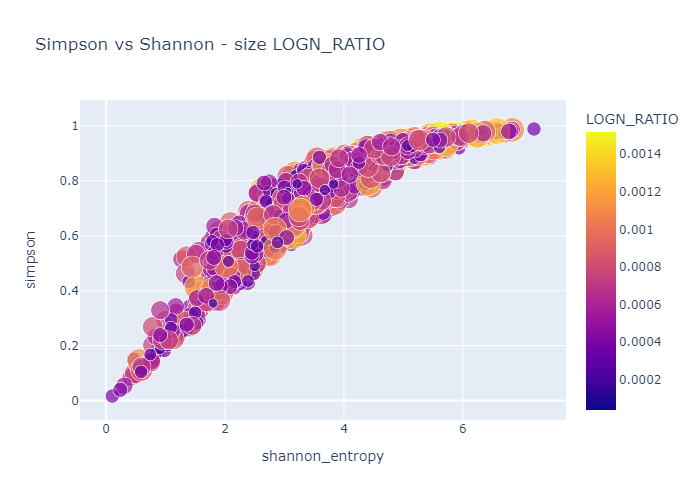

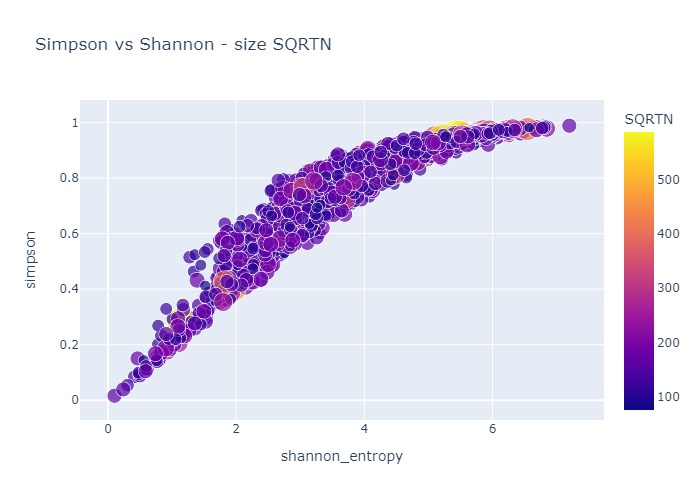

In [53]:
#Shannon vs simpsons, tamaño = variable
see = diversities.select_dtypes(include=np.number).columns.tolist()
see =  ['sample-frequency', 'singles', 'observed_features'] + aux_metrics 
for col in see: 
    fig = px.scatter(diversities, x='shannon_entropy', y='simpson', size=col, color=col, title=f"Simpson vs Shannon - size {col}")
    fig.show(renderer='png')

In [58]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
colums = diversities.columns.tolist()
fig = make_subplots(rows=10, cols=2, start_cell="bottom-left")
for f in columns:
    fig.add_trace(go.Scatter(x=diversities['OTU1_RATIO'], y=diversities[f]))
fig.show()


In [165]:
#Calculo correlaciones
from scipy.stats import pearsonr, kendalltau

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues


#Calculo correlaciones
correlations_spearman = diversities.corr(method='spearman')
fig_heat_spearman = px.imshow(correlations_spearman,
                    title='Spearman correlation between metrics for ' + dataset,
                    height=800,width=800)
fig_heat_spearman.show()

#Calculo significancia
pval_spearman = calculate_pvalues(diversities)
fig_heat_spearman_pval = px.imshow(pval_spearman,
                    title='pvalues for Spearman correlation between metrics for ' + dataset,
                     height=800,width=800)
fig_heat_spearman_pval.show()



In [167]:
aux = diversities[aux_metrics]
correlations_spearman = aux.corr(method='spearman')
fig_heat_spearman = px.imshow(correlations_spearman,
                    title='Spearman correlation between metrics for ' + dataset)
fig_heat_spearman.show()

#Calculo significancia
pval_spearman = calculate_pvalues(aux)
fig_heat_spearman_pval = px.imshow(pval_spearman,
                    title='pvalues for Spearman correlation between metrics for ' + dataset)
fig_heat_spearman_pval.show()

## Visualizaciones auxiliares

Faith, singles, doubles

In [168]:
for ys in ['observed_features','singles','doubles','faith_pd']:
    fig = px.box(new, y=ys, x='Metric',
                 color='Metric',
                 hover_data=['sample-id'],
                 points="all",height=600, width=1000)
    fig.update_layout(title_text="{}: {} for all samples, grouped if they are outliers".format(dataset,ys))
    fig.show()

### Solo para un subgrupo

In [13]:
chao = new[new['Metric']=='chao1']
ref = chao.chao1.min()
sli = new[new['observed_features']>ref]
fig = px.box(sli, y='fisher_alpha', x='Metric',
                 color='Metric',
                 hover_data=['sample-id'],
                 points="all",height=600, width=1000)
fig.show()

# EXPLORATORIO VIEJO

In [14]:
for ys in metrics:
    fig = px.box(new, y=ys, x='Metric',
                 color='Metric',
                 hover_data=['sample-id'],
                 points="all",height=600, width=900)
    fig.update_layout(title_text="{} for all samples, grouped if they are outliers".format(ys))
    #fig.show()

In [15]:
#Asigno categorias a cada metrica
metric_map = {'ace' : 'Abundancia',
                   'berger_parker_d' : "Equality",
                   'brillouin_d' : 'Info-Shannon',
                   'chao1' : 'Abundancia',
                   'dominance': "Equality",
                   'doubles': 'Abundancia',
                   'enspie': "Equality",
                   'fisher_alpha': "Equality",
                   'faith_pd':'Phylo',
                   'gini_index': "Equality",
                   'goods_coverage': 'Abundancia',
                   'heip_e': 'Info-Shannon',
                   'lladser_pe': 'Abundancia',
                   'margalef': 'Abundancia',
                   'mcintosh_d': 'Abundancia',
                   'menhinick': 'Abundancia',
                   'observed_features': 'Abundancia',
                   'pielou_evenness': 'Info-Shannon',
                   'robbins': 'Abundancia',
                   'shannon_entropy': 'Info-Shannon',
                   'simpson': 'Info-Simpsons', 
                   'singles': 'Abundancia',
                   'strong': "Equality"}

metric_map_gr = {'Abundancia': ['ace', 'chao1','goods_coverage',
                                'lladser_pe', 'margalef','mcintosh_d',
                                'menhinick','robbins'],
                'Equality': ['berger_parker_d' ,'dominance','enspie','fisher_alpha',
                              'gini_index','strong'],
                'Info-Shannon':['brillouin_d',  'heip_e', 'pielou_evenness', 'shannon_entropy'],
                'Info-Simpsons':['simpson'],
                'Phylo':['faith_pd'],
                'Stats':['observed_features', 'singles', 'doubles', 'sample-frequency']}

metric_categories  = metric_map_gr.keys()

df['is_outlier_cat'] = df['is_outlier']
df = df.replace({'is_outlier_cat': metric_map})
display( df['is_outlier_cat'].value_counts())

/tmp/ipykernel_13530/3895936628.py:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



False            584
Info-Simpsons     61
Abundancia        53
Equality          18
Name: is_outlier_cat, dtype: int64

In [16]:
# Busco correlaciones a partir de truth table
ttemp  = tt[metrics]
t_dict = {True:1, False:0}
for m in metrics:
    ttemp[m] = ttemp[m].map(t_dict)
correlations_spearman = ttemp.corr(method='spearman')
fig_heat_spearman = px.imshow(correlations_spearman,
                    title='Spearman correlation')
#fig_heat_spearman.show()


/tmp/ipykernel_13530/1840765010.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [17]:
## Cuento el numero de ocurrencias para cada metrica.
occ = {}
for m in metrics:
    occ[m] = tt[m].sum()
occ = pd.DataFrame.from_dict(occ,orient='index')
occ.reset_index(level=0, inplace=True)
occ.columns=['Metric', 'count']
occ['metric_cat'] = occ['Metric']
occ = occ.replace({'metic_cat': metric_map})
#display(occ)
figvio = px.bar(occ, y='count', x='Metric', color='metric_cat')
#figvio.show()

In [18]:
#figvio = px.histogram(df, x='is_outlier_n', color='is_outlier')
#figvio.show()
#figvio = px.histogram(df, x='is_outlier_n', color='is_outlier_cat')
#figvio.show()

# Grafico por categoria de outlier / Sin incluir el mismo grupo

In [19]:
for mm in metric_map_gr.keys():
    h = ((len(metric_map_gr[mm])%4))*500
    fig = px.box(df[df['is_outlier_cat']!=mm], x=category, y=metric_map_gr[mm],
             facet_col ="variable", color = 'is_outlier_cat'
            , facet_col_wrap=4,
            title=str(mm),
            height=h,
            facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
            facet_col_spacing=0.04,
               points='all')
    
    fig.update_yaxes(matches=None)
    fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
    fig.update_yaxes(showticklabels=True)
    #fig.show()

# Grafico por categoria de outlier / incluyendo el mismo grupo

In [20]:
for mm in metric_map_gr.keys():
    h = ((len(metric_map_gr[mm])%4))*500
    fig = px.box(df, x=category, y=metric_map_gr[mm],
             facet_col ="variable", color = 'is_outlier_cat'
            , facet_col_wrap=4,
            title=str(mm),
            height=h,
            facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
            facet_col_spacing=0.04,
               points='all')
    fig.update_yaxes(matches=None)
    fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
    fig.update_yaxes(showticklabels=True)
    #fig.show()

## Recorto samples que son outliers de + 1 metrica

In [21]:
dftemp = df[df['is_outlier_n'] < 2]
for mm in metric_map_gr.keys():
    h = ((len(metric_map_gr[mm])%3))*600
    fig = px.box(dftemp, x=category, y=metric_map_gr[mm],
             facet_col ="variable", color = 'is_outlier'
            , facet_col_wrap=3,
            title=str(mm),
            height=h,
            facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
            facet_col_spacing=0.04,
               points='all')
    
    fig.update_yaxes(matches=None)
    fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
    fig.update_yaxes(showticklabels=True)
    #fig.show()

In [22]:
figbox = px.box(df, x=category, y=metrics,
             facet_col ="variable", color = 'is_outlier_cat'
            , facet_col_wrap=4,
            title="Alfa diversidad "+ opt + ' segun ' + category,
            height=2500,facet_col_spacing=0.04,
               points='all')
figbox.update_yaxes(matches=None)
figbox.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
#figbox.update_yaxes(showticklabels=True)
#figbox.show()

In [23]:
#Sample frequency vs n otus
fig=px.scatter(df, x='sample-frequency', color='is_outlier_cat', y='observed_features')
#fig.show()

In [24]:
for mm in metric_map_gr.keys():
    h = ((len(metric_map_gr[mm])%4))*500
    fig = px.box(df[df['is_outlier_cat']!=mm], x=category, y=metric_map_gr[mm],
             facet_col ="variable", color = 'is_outlier'
            , facet_col_wrap=4,
            title=str(mm),
            height=h,
            facet_row_spacing=0.04, # default is 0.07 when facet_col_wrap is used
            facet_col_spacing=0.04,
               points='all')
    
    fig.update_yaxes(matches=None)
    fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
    fig.update_yaxes(showticklabels=True)
    #fig.show()